# Deep Learning - Final Project

### Student 1: Shachar Hananya 324165133
### Student 2: Kanna Nahir 211319876


# Import Libraries and Loading Data

In [1]:
import os
import gc
import time
import argparse
import glob
import random
from tqdm import tqdm
from copy import copy

import torch
from torch import nn
import numpy as np

from matplotlib import pyplot as plt

from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torch.nn.init as init

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples, silhouette_score

from torchvision import models, transforms

import pickle as pkl

torch.cuda.empty_cache()
gc.collect()

39

In [5]:
! pip install -q kaggle

from google.colab import files
files.upload()

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c gan-getting-started

Saving kaggle.json to kaggle.json
mkdir: cannot create directory ‘/root/.kaggle’: File exists
100% 366M/367M [00:19<00:00, 16.3MB/s]
100% 367M/367M [00:19<00:00, 19.5MB/s]


In [6]:
! mkdir data
! unzip gan-getting-started.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/photo_jpg/46e84039a1.jpg  
  inflating: data/photo_jpg/46f391abec.jpg  
  inflating: data/photo_jpg/46f5ef1042.jpg  
  inflating: data/photo_jpg/4706619607.jpg  
  inflating: data/photo_jpg/4707b03a08.jpg  
  inflating: data/photo_jpg/47100a9939.jpg  
  inflating: data/photo_jpg/471f4755b9.jpg  
  inflating: data/photo_jpg/472b351bc4.jpg  
  inflating: data/photo_jpg/472d5ac100.jpg  
  inflating: data/photo_jpg/4758e5dd4c.jpg  
  inflating: data/photo_jpg/4762bb79ef.jpg  
  inflating: data/photo_jpg/4778b13518.jpg  
  inflating: data/photo_jpg/4787b82d37.jpg  
  inflating: data/photo_jpg/478e07feaa.jpg  
  inflating: data/photo_jpg/478eb12a82.jpg  
  inflating: data/photo_jpg/479698b371.jpg  
  inflating: data/photo_jpg/4796d67f61.jpg  
  inflating: data/photo_jpg/47aad493bd.jpg  
  inflating: data/photo_jpg/47ae0edd23.jpg  
  inflating: data/photo_jpg/47b94957ff.jpg  
  inflating: data/photo_jpg/47bb43fe3e.jpg  
  in

Define a device and an image size

In [7]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
IMG_SIZE = 320, 320

A timer decorator to measure the running time of a function

In [9]:
def timer(func):
    def wrapper(*args, **kwargs):
        start = time.time()
        result = func(*args, **kwargs)
        end = time.time()
        print(f"{func.__name__} took {end - start} seconds")
        return result

    return wrapper

# Load Data


Load data paths

In [10]:
monet_paths = glob.glob('data/monet_jpg/*.jpg')
photo_paths = glob.glob('data/photo_jpg/*.jpg')

Load photos, resize to the required size and convert to tensors

In [11]:
photo = [torch.from_numpy(np.array(Image.open(path).resize(IMG_SIZE))) for path in photo_paths]

## Choose Monet Paintings

For choosing the paintings for the models' training processes, we aimed to choose a paintings which are differ from each other as most as we can estimate - that is because we would like to avoid the mode collapse.

To do so, we reduced the paintings dimensions using the PCA algorithm, clustered the dense lower-dimension representations, and chose the images that are mostly differ from other cluster - using the silhoutte score.

In [12]:
monet = [Image.open(path) for path in monet_paths]
monet_ = monet

monet_ = [np.array(i) for i in monet_]
monet_ = [i.flatten() for i in monet_]

monet_ = np.array(monet_)

monet_.shape

(300, 196608)

Reducing the dimension of the images

Calculating Variance: 300it [00:00, 658791.20it/s]


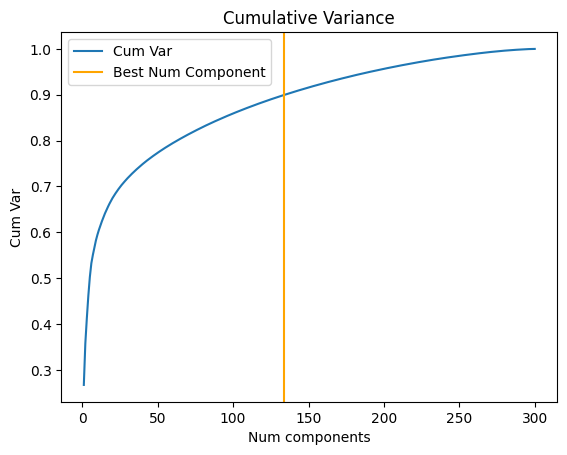


Best number of components:	134


In [13]:
scaler = MinMaxScaler()
monet_ = scaler.fit_transform(monet_)

pca = PCA()
pca.fit(monet_)
monet_pca = pca.transform(monet_)

cum_vars = {}
cum_var = 0

found90 = False

for n_comp, var_comp in tqdm(enumerate(pca.explained_variance_ratio_), desc="Calculating Variance"):
    cum_var += var_comp
    cum_vars[n_comp + 1] = cum_var

    if not found90 and cum_var > 0.9:
      best_n_comp = n_comp
      found90 = True

plt.plot(cum_vars.keys(), cum_vars.values(), label="Cum Var")
plt.axvline(best_n_comp, label="Best Num Component", c='orange')

plt.title("Cumulative Variance")
plt.xlabel("Num components")
plt.ylabel("Cum Var")

plt.legend()

plt.savefig("PCA_var.png")

plt.show()

print(f"\nBest number of components:\t{best_n_comp}")

pca = PCA(n_components=best_n_comp)
pca.fit(monet_)
monet_pca = pca.transform(monet_)

### Cluster the embeddings

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

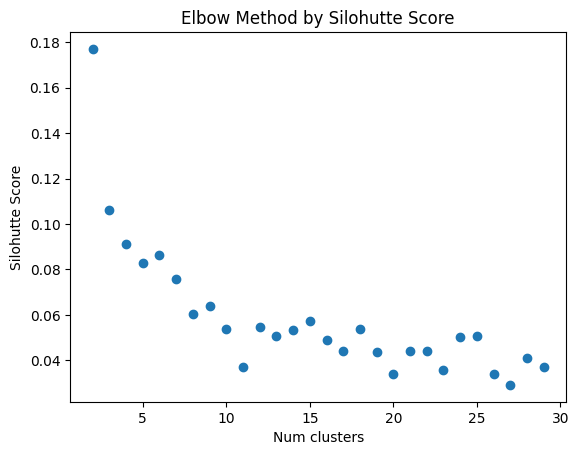

In [14]:
silhouette_scores = {}

for k in range(2, 30):
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(monet_pca)
  clusters = kmeans.predict(monet_pca)

  silhouette_scores[k] = silhouette_score(monet_pca, clusters)

plt.scatter(silhouette_scores.keys(), silhouette_scores.values(), marker='o')
plt.title("Elbow Method by Silohutte Score")
plt.xlabel("Num clusters")
plt.ylabel("Silohutte Score")
plt.show()

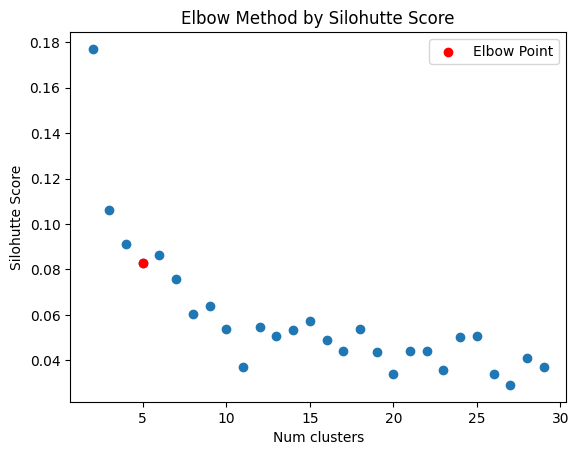

In [15]:
k_clusters = 5

plt.scatter(silhouette_scores.keys(), silhouette_scores.values(), marker='o')
plt.scatter([k_clusters], silhouette_scores[k_clusters], color='red', label='Elbow Point', marker='o')

plt.title("Elbow Method by Silohutte Score")
plt.xlabel("Num clusters")
plt.ylabel("Silohutte Score")
plt.legend()
plt.savefig("kmeaens_elbow.png")
plt.show()

In [16]:
kmeans = KMeans(n_clusters=k_clusters)
kmeans.fit(monet_pca)
clusters = kmeans.predict(monet_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


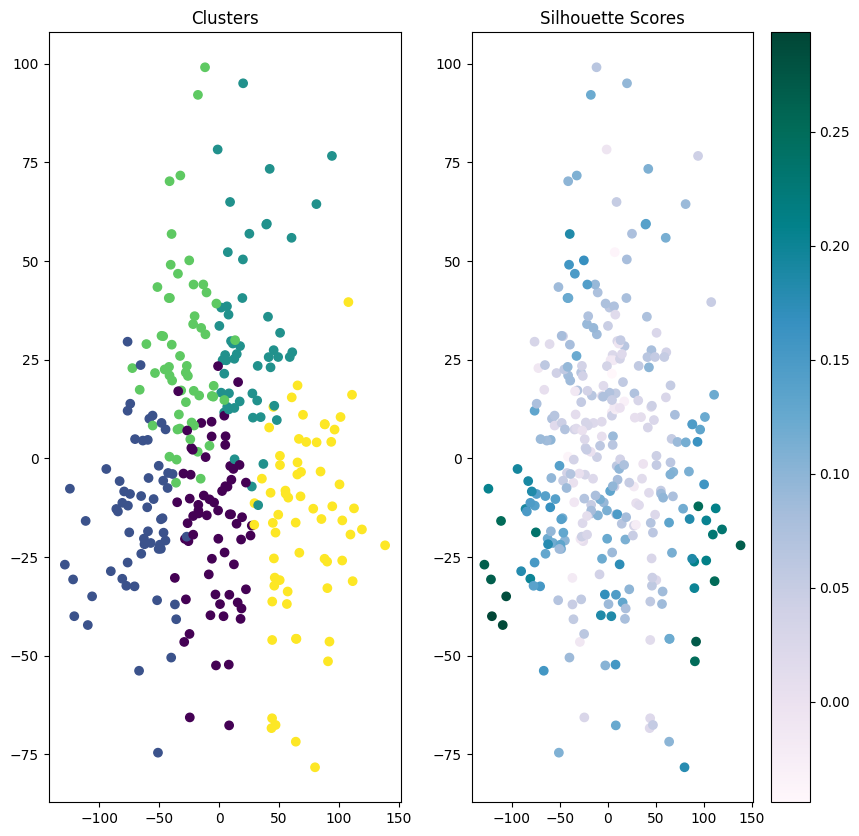

In [18]:
fig = plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.scatter(monet_pca[:, 0], monet_pca[:, 1], c=clusters)
scores = silhouette_samples(monet_pca, clusters)
plt.title('Clusters')

plt.subplot(1, 2, 2)
plt.scatter(monet_pca[:, 0], monet_pca[:, 1], c=scores, cmap='PuBuGn')
plt.colorbar()

plt.title('Silhouette Scores')

plt.savefig("im_space_after_pca.png")
plt.show()

In [19]:
highest_sil_scores = np.argpartition(-scores, 30)[:30]
monet = [monet[idx] for idx in highest_sil_scores]
monet = [torch.from_numpy(np.array(img.resize(IMG_SIZE))) for img in monet]

In [21]:
len(monet), len(photo)

(30, 7038)

# First Model

## Model Classes

Define class for the generator, the PatchGAN discriminator and the Cycle-GAN model.

In [22]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=4).to(DEVICE)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=2, stride=2).to(DEVICE)
        self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=2, stride=2).to(DEVICE)

        self.deconv1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2).to(DEVICE)
        self.deconv2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2).to(DEVICE)
        self.deconv3 = nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=4).to(DEVICE)

        self.batch_norm1 = nn.BatchNorm2d(64).to(DEVICE)
        self.batch_norm2 = nn.BatchNorm2d(128).to(DEVICE)
        self.batch_norm3 = nn.BatchNorm2d(256).to(DEVICE)
        self.batch_norm4 = nn.BatchNorm2d(128).to(DEVICE)
        self.batch_norm5 = nn.BatchNorm2d(64).to(DEVICE)
        self.batch_norm6 = nn.BatchNorm2d(3).to(DEVICE)

        self.leaky_relu = nn.LeakyReLU()


    def forward(self, x):
        x = self.conv1(x)
        x = self.batch_norm1(x)
        x = self.leaky_relu(x)

        x = self.conv2(x)
        x = self.batch_norm2(x)
        x = self.leaky_relu(x)

        x = self.conv3(x)
        x = self.batch_norm3(x)
        x = self.leaky_relu(x)

        x = self.deconv1(x)
        x = self.batch_norm4(x)
        x = self.leaky_relu(x)

        x = self.deconv2(x)
        x = self.batch_norm5(x)
        x = self.leaky_relu(x)

        x = self.deconv3(x)
        x = self.batch_norm6(x)
        x = nn.Tanh()(x)

        return x

In [23]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=4, bias=False)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=2, stride=2, bias=False)
        self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=2, stride=2, bias=False)
        self.conv4 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False)
        self.conv5 = nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, bias=False)

        self.batch_norm1 = nn.BatchNorm2d(128)
        self.batch_norm2 = nn.BatchNorm2d(256)
        self.batch_norm3 = nn.BatchNorm2d(512)

        self.leaky_relu = nn.LeakyReLU()


    def forward(self, x):
        x = self.conv1(x)
        x = self.leaky_relu(x)

        x = self.conv2(x)
        x = self.batch_norm1(x)
        x = self.leaky_relu(x)

        x = self.conv3(x)
        x = self.batch_norm2(x)
        x = self.leaky_relu(x)

        x = self.conv4(x)
        x = self.batch_norm3(x)
        x = self.leaky_relu(x)

        x = self.conv5(x)

        x = nn.Sigmoid()(x)
        return x


In [24]:
class CycleGAN(nn.Module):
    def __init__(self):
        super().__init__()

        self.G = Generator().to(DEVICE)
        self.F = Generator().to(DEVICE)
        self.D_X = Discriminator().to(DEVICE)
        self.D_Y = Discriminator().to(DEVICE)

    def forward(self, x, y):
        x2y = self.G(x)
        y2x = self.F(y)
        x2y2x = self.F(x2y)
        y2x2y = self.G(y2x)

        x2y2x2y = self.G(x2y2x)
        y2x2y2x = self.F(y2x2y)

        x2y_disc = self.D_Y(x2y)
        y2x_disc = self.D_X(y2x)

        return x2y, y2x, x2y2x, y2x2y, x2y2x2y, y2x2y2x, x2y_disc, y2x_disc

## Data Process

Define convertors between PIL images to model input, and back.

In [25]:
pil2inp = lambda img: (img.reshape(-1, 3, *IMG_SIZE) - 127.5) / 127.5
inp2pil = lambda img: img.reshape(-1, *IMG_SIZE, 3) * 127.5 + 127.5

Define a class for CycleGAN Dataset that return a pair of photo-painting when call its elements. In addition, following the lack of monet paintings, we added an option to add augmentation to the paintings. Since we mainly need to extract the "style" of the paintings, we only allowed rotation by 90 degrees, which can still catpure this Monet style in the augmented paintings.

In [26]:
class CycleGANDataset(Dataset):
    def __init__(self, monet, photo, shuffle=True, use_augmntations=True):
        self.monet = monet
        self.photo = photo

        if shuffle:
            np.random.shuffle(self.monet)
            np.random.shuffle(self.photo)

        self.augmentations = [
            lambda img: img,
            lambda img: torch.transpose(img, 0, 1),
        ]

        self.use_augmntations = use_augmntations

    def __getitem__(self, index):
        idx_monet = index % len(self.monet)
        idx_photo = index % len(self.photo)

        monet, photo = self.monet[idx_monet], self.photo[idx_photo]

        if self.use_augmntations:
            aug = random.sample(self.augmentations, 1)[0]
            monet = aug(monet)

        return monet, photo

    def __len__(self):
        return min(len(self.monet), len(self.photo))

## Training Functions

Define a function for the training process of the first model.

Input:
1.   Model object to train
2.   Photos and paintings to train with
3.   Number of training epochs
4.   Learning rates for the generator and discriminator
5.   lambda_cycle and lambda_id - coefficients for the generator loss.
6.   Functions that determines in which epochs the generator and the discriminator are trained

Notice that the generator loss is slightly different than the one we were learned in class, since we add another component to it that, besides the GAN and the cycle losses, encourages the data in each domain not to change while  passing through the generator of the other domain.

During the process, we applied some adjustments that we found helpful for the model convergence:
1.   After examing multiple combinations for the loss functions, we finally used Binary Cross-Entropy for the GAN losses, Mean Squared Errors for the cycle loss and Mean Absolute Errors for the identity loss.
2.   We are using soft labels (values between 0 to 0.1 instead of just 0, and 0.9 to 1 instead of 1), for the discriminators training.

In [27]:
def train_cycle_gan(model, train_loader, num_epochs, lr_gen, lr_dis, lambda_cycle, lambda_id, train_d_func, train_g_func):
    model.train()

    # Define optimizers for both the generator and discriminators

    g_optimizer = torch.optim.Adam(list(model.G.parameters()) + list(model.F.parameters()), lr=lr_gen)
    d_x_optimizer = torch.optim.Adam(model.D_X.parameters(), lr=lr_dis)
    d_y_optimizer = torch.optim.Adam(model.D_Y.parameters(), lr=lr_dis)

    # Define loss functions

    criterion_gan = nn.BCELoss()
    criterion_cycle = nn.MSELoss()
    criterion_identity = nn.L1Loss()

    # Initialize lists to store the training process

    g_gan_losses = []
    g_cycle_losses = []
    g_id_losses = []
    d_losses = []

    for epoch in range(1, num_epochs + 1):
        train_d = train_d_func(epoch)
        train_g = train_g_func(epoch)

        epoch_g_gan_losses = []
        epoch_g_cycle_losses = []
        epoch_g_id_losses = []
        epoch_d_losses = []

        for i, (x, y) in enumerate(train_loader):
            # Freeze generator weights

            for g in model.G.parameters():
                g.requires_grad = False

            for f in model.F.parameters():
                f.requires_grad = False

            for d_x in model.D_X.parameters():
                d_x.requires_grad = train_d

            for d_y in model.D_Y.parameters():
                d_y.requires_grad = train_d

            x = pil2inp(x)
            y = pil2inp(y)

            x = x.to(DEVICE)
            y = y.to(DEVICE)

            x_true, y_true = x, y

            # Train discriminator X

            y2x = model.F(y)
            y2x_disc = model.D_X(y2x)

            x_disc = model.D_X(x_true)

            soft_zero = torch.rand_like(y2x_disc) * 0.1
            soft_one = 0.9 + torch.rand_like(x_disc) * 0.1

            d_x_loss = (criterion_gan(y2x_disc, soft_zero) + criterion_gan(x_disc, soft_one)) / 2

            d_x_optimizer.zero_grad()

            if train_d:
                d_x_loss.backward(retain_graph=True)

            # Train discriminator Y

            x2y = model.G(x)
            x2y_disc = model.D_Y(x2y)

            y_disc = model.D_Y(y_true)

            # train discriminator Y with soft labels

            soft_zero = torch.rand_like(x2y_disc) * 0.1
            soft_one = 0.9 + torch.rand_like(y_disc) * 0.1

            d_y_loss = (criterion_gan(x2y_disc, soft_zero) + criterion_gan(y_disc, soft_one)) / 2

            d_y_optimizer.zero_grad()

            if train_d:
                d_y_loss.backward(retain_graph=True)

            d_x_optimizer.step()
            d_y_optimizer.step()

            # Train generator

            # Freeze discriminator weights

            for g in model.G.parameters():
                g.requires_grad = True

            for f in model.F.parameters():
                f.requires_grad = True

            for d_x in model.D_X.parameters():
                d_x.requires_grad = False

            for d_y in model.D_Y.parameters():
                d_y.requires_grad = False

            x2y = model.G(x)
            x2y_disc = model.D_Y(x2y)
            y2x = model.F(y)
            y2x_disc = model.D_X(y2x)
            x2y2x = model.F(x2y)
            y2x2y = model.G(y2x)

            g_gan_loss = criterion_gan(x2y_disc, torch.ones_like(x2y_disc)) + criterion_gan(y2x_disc,
                                                                                            torch.ones_like(y2x_disc))

            g_cycle_loss = criterion_cycle(x2y2x, x) + criterion_cycle(y2x2y, y)

            g_id_loss = criterion_identity(model.F(x), x) + criterion_identity(model.G(y), y)

            g_loss = g_gan_loss + lambda_cycle * g_cycle_loss + lambda_id * g_id_loss

            g_optimizer.zero_grad()

            if train_g:
                g_loss.backward(retain_graph=True)

            g_optimizer.step()

            epoch_d_losses.append(d_x_loss.item() + d_y_loss.item())
            epoch_g_gan_losses.append(g_gan_loss.item())
            epoch_g_cycle_losses.append(g_cycle_loss.item())
            epoch_g_id_losses.append(g_id_loss.item())

            if i % 5 == 0:
                print(
                    f'Epoch [{epoch}/{num_epochs}] Step [{i}/{len(train_loader)}] D_X loss: {d_x_loss.item():.4f} '
                    f'D_Y loss: {d_y_loss.item():.4f} G_GAN loss: {g_gan_loss.item():.4f} G_Cycle loss: {g_cycle_loss.item():.4f} G_Id loss: {g_id_loss.item():.4f}'
                )

        d_losses.append(np.mean(epoch_d_losses))
        g_gan_losses.append(np.mean(epoch_g_gan_losses))
        g_cycle_losses.append(np.mean(epoch_g_cycle_losses))
        g_id_losses.append(np.mean(epoch_g_id_losses))

        if HP1["STORE_TMP_MODELS"] and epoch % 10 == 0:
            torch.save(model.state_dict(), f'tmp_models/cycle_gan_{epoch}.pth')

    torch.save(model.state_dict(), f'cycle_gan_final.pth')

    plt.subplot(1, 2, 1)

    plt.plot(d_losses, label='Discriminator')
    plt.plot(g_gan_losses, label='Generator GAN')

    plt.title("GAN losses")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)

    plt.plot(g_cycle_losses, label='Generator Cycle')
    plt.plot(g_id_losses, label='Generator Identity')
    plt.title("Cycle and Identitly Losses")

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.savefig("first_model_losses.png")

    plt.show()

In [28]:
def plot_results(x, x2y, n_images=10):
    fig = plt.figure(figsize=(10, 10))

    for i in range(1, 1 + n_images):
        plt.subplot(n_images, 2, 2 * i - 1)
        plt.imshow(x[i])

        if i == 1:
            plt.title("Original Image")

        plt.subplot(n_images, 2, 2 * i)
        plt.imshow(x2y[i])

        if i == 1:
            plt.title("Generated Image")

    plt.savefig("first_model_examples.png")
    plt.show()

Main function for the first model training.

Gets a dictionary of hyper-parameters, and outputs the trained model.

In [29]:
@timer
def train_main_first_model(hp):
    dataset = CycleGANDataset(monet, photo, shuffle=True, use_augmntations=hp["USE_AUG"])
    train_loader = DataLoader(dataset, batch_size=hp["BATCH_SIZE"])

    # create a model
    model = CycleGAN()

    # train the model
    train_cycle_gan(
        model,
        train_loader,
        num_epochs=hp["N_EPOCHS"],
        lr_gen=hp["LR_GEN"],
        lr_dis=hp["LR_DIS"],
        lambda_cycle=hp["LAM_CYCLE"],
        lambda_id=hp["LAM_ID"],
        train_d_func=hp["TRAIN_D_FUNC"],
        train_g_func=hp["TRAIN_G_FUNC"],
        )

    print("Training complete")

    return model


Main function for the first model testing.

Gets the trained model, number of images to test, and a flag whether to calculate the FID score, as an input.

In [30]:
@timer
def test_main_first_model(model=None, n_images=10, calc_fid=True):
    monet_test = random.sample(monet, 30)
    photo_test = random.sample(photo, 30)

    # if model object is not given, load it from the path of the saved image

    if model is None:
        model = CycleGAN()
        model.load_state_dict(torch.load(HP1["MODEL_PATH"], map_location=DEVICE))

    model.eval()

    x = torch.stack(photo_test)
    y = torch.stack(monet_test)

    x = pil2inp(x).to(DEVICE)
    y = pil2inp(y).to(DEVICE)

    x2y, y2x, x2y2x, y2x2y, x2y2x2y, y2x2y2x, x2y_disc, y2x_disc = model(x, y)


    x = inp2pil(x).long().cpu().detach().numpy()
    y = inp2pil(y).long().cpu().detach().numpy()
    x2y = inp2pil(x2y).long().cpu().detach().numpy()
    y2x = inp2pil(y2x).long().cpu().detach().numpy()

    plot_results(x, x2y, n_images=n_images)

    # calculate the FID score for the images
    if calc_fid:
        from torchmetrics.image.fid import FrechetInceptionDistance

        fid = FrechetInceptionDistance().to(DEVICE)
        fid.update(torch.from_numpy(x2y).to(torch.uint8).to(DEVICE).reshape(-1, 3, *IMG_SIZE), real=False)
        fid.update(torch.from_numpy(y).to(torch.uint8).to(DEVICE).reshape(-1, 3, *IMG_SIZE), real=True)

        fid_res = fid.compute().item()
        print(f"FID score G: {fid_res}")

        return fid_res


## Hyper-Parameters

Define hyper-parameters for the first model.

We found that training only the discriminators at the first 15 epochs, and then train it once in 10 epochs, helps the model to converge.

In [31]:
# Hyper-parameters
HP1 = {
  "LAM_CYCLE": 10,
  "LAM_ID": .5,
  "N_EPOCHS": 600,
  "MODEL_PATH": 'cycle_gan_final.pth',
  "LR_GEN": 1e-3,
  "LR_DIS": 1e-4,
  "BATCH_SIZE": 10,
  "CALC_FID": True,
  "USE_AUG": True
 }

HP1["TRAIN_D_FUNC"] = lambda e: e <= 15 or e % 10 == 0
HP1["TRAIN_G_FUNC"] =  lambda e: not HP1["TRAIN_D_FUNC"](e)

if HP1["CALC_FID"]:
    ! pip install torchmetrics
    ! pip install torch-fidelity

HP1["STORE_TMP_MODELS"] = False

if HP1["STORE_TMP_MODELS"]:
    os.makedirs('tmp_models', exist_ok=True)



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 35.7 MB/s eta 0:00:00


## Training and Testing Processes

Epoch [1/600] Step [0/3] D_X loss: 0.7096 D_Y loss: 0.7109 G_GAN loss: 1.5653 G_Cycle loss: 1.3603 G_Id loss: 1.3217
Epoch [2/600] Step [0/3] D_X loss: 0.6154 D_Y loss: 0.6147 G_GAN loss: 1.7873 G_Cycle loss: 1.3619 G_Id loss: 1.3230
Epoch [3/600] Step [0/3] D_X loss: 0.5380 D_Y loss: 0.5368 G_GAN loss: 1.9553 G_Cycle loss: 1.3604 G_Id loss: 1.3230
Epoch [4/600] Step [0/3] D_X loss: 0.5242 D_Y loss: 0.5241 G_GAN loss: 2.1523 G_Cycle loss: 1.3617 G_Id loss: 1.3228
Epoch [5/600] Step [0/3] D_X loss: 0.4675 D_Y loss: 0.4820 G_GAN loss: 2.3297 G_Cycle loss: 1.3615 G_Id loss: 1.3234
Epoch [6/600] Step [0/3] D_X loss: 0.4096 D_Y loss: 0.4275 G_GAN loss: 2.5797 G_Cycle loss: 1.3614 G_Id loss: 1.3237
Epoch [7/600] Step [0/3] D_X loss: 0.3702 D_Y loss: 0.3750 G_GAN loss: 2.9292 G_Cycle loss: 1.3607 G_Id loss: 1.3229
Epoch [8/600] Step [0/3] D_X loss: 0.3454 D_Y loss: 0.3628 G_GAN loss: 3.0171 G_Cycle loss: 1.3605 G_Id loss: 1.3218
Epoch [9/600] Step [0/3] D_X loss: 0.3066 D_Y loss: 0.3242 G_GAN

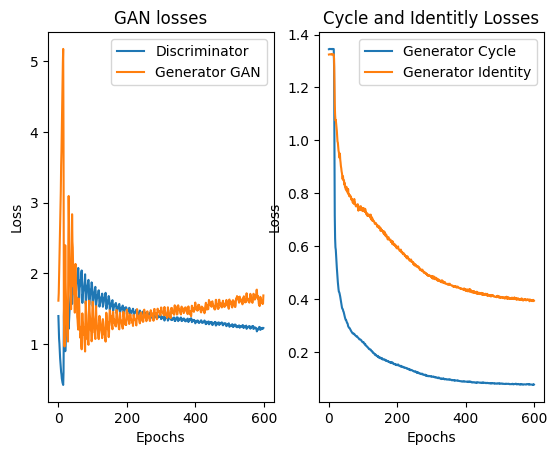

Training complete
train_main_first_model took 97.93182730674744 seconds


In [34]:
first_model = train_main_first_model(HP1)

In [35]:
pkl.dump(first_model.cpu(), open('first_model.pkl', 'wb'))

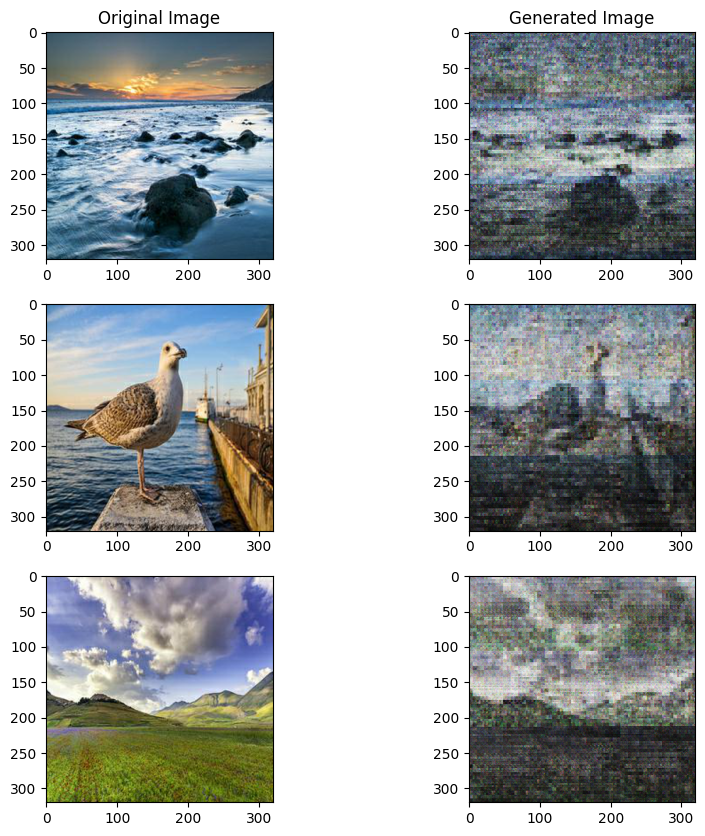

FID score G: 145.532958984375
test_main_first_model took 8.032241106033325 seconds


145.532958984375

In [61]:
test_main_first_model(first_model.to(DEVICE), n_images=3, calc_fid=HP1["CALC_FID"])

# First Model Experiments

## Exp 1: Using Augmentations

An experimeent that check whether the addition of the augmentation improves the model performence.

Define hyper-parameters for the experminet

In [62]:
hp_aug = copy(HP1)
hp_aug["USE_AUG"] = True

hp_no_aug = copy(HP1)
hp_no_aug["USE_AUG"] = False

Epoch [1/600] Step [0/3] D_X loss: 0.7086 D_Y loss: 0.7125 G_GAN loss: 1.7249 G_Cycle loss: 1.3928 G_Id loss: 1.3366
Epoch [2/600] Step [0/3] D_X loss: 0.6093 D_Y loss: 0.6206 G_GAN loss: 1.6837 G_Cycle loss: 1.3935 G_Id loss: 1.3365
Epoch [3/600] Step [0/3] D_X loss: 0.5283 D_Y loss: 0.5405 G_GAN loss: 1.8992 G_Cycle loss: 1.3918 G_Id loss: 1.3362
Epoch [4/600] Step [0/3] D_X loss: 0.5008 D_Y loss: 0.5195 G_GAN loss: 2.2124 G_Cycle loss: 1.3920 G_Id loss: 1.3369
Epoch [5/600] Step [0/3] D_X loss: 0.4412 D_Y loss: 0.4597 G_GAN loss: 2.3879 G_Cycle loss: 1.3925 G_Id loss: 1.3351
Epoch [6/600] Step [0/3] D_X loss: 0.4175 D_Y loss: 0.4401 G_GAN loss: 2.3883 G_Cycle loss: 1.3912 G_Id loss: 1.3352
Epoch [7/600] Step [0/3] D_X loss: 0.3498 D_Y loss: 0.3695 G_GAN loss: 2.8678 G_Cycle loss: 1.3932 G_Id loss: 1.3367
Epoch [8/600] Step [0/3] D_X loss: 0.3303 D_Y loss: 0.3488 G_GAN loss: 3.1419 G_Cycle loss: 1.3928 G_Id loss: 1.3358
Epoch [9/600] Step [0/3] D_X loss: 0.3075 D_Y loss: 0.3275 G_GAN

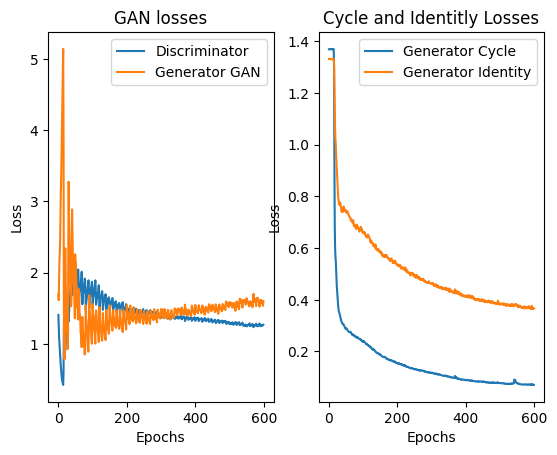

Training complete
train_main_first_model took 83.49972200393677 seconds


In [63]:
model_aug = train_main_first_model(hp_aug)

Epoch [1/600] Step [0/3] D_X loss: 0.7177 D_Y loss: 0.7154 G_GAN loss: 1.5380 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [2/600] Step [0/3] D_X loss: 0.5968 D_Y loss: 0.5845 G_GAN loss: 1.8624 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [3/600] Step [0/3] D_X loss: 0.5230 D_Y loss: 0.5179 G_GAN loss: 2.0136 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [4/600] Step [0/3] D_X loss: 0.4710 D_Y loss: 0.4685 G_GAN loss: 2.2212 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [5/600] Step [0/3] D_X loss: 0.4353 D_Y loss: 0.4213 G_GAN loss: 2.5631 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [6/600] Step [0/3] D_X loss: 0.3871 D_Y loss: 0.3826 G_GAN loss: 2.7868 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [7/600] Step [0/3] D_X loss: 0.3500 D_Y loss: 0.3445 G_GAN loss: 2.9627 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [8/600] Step [0/3] D_X loss: 0.3187 D_Y loss: 0.3122 G_GAN loss: 3.2935 G_Cycle loss: 1.2595 G_Id loss: 1.2797
Epoch [9/600] Step [0/3] D_X loss: 0.2878 D_Y loss: 0.2822 G_GAN

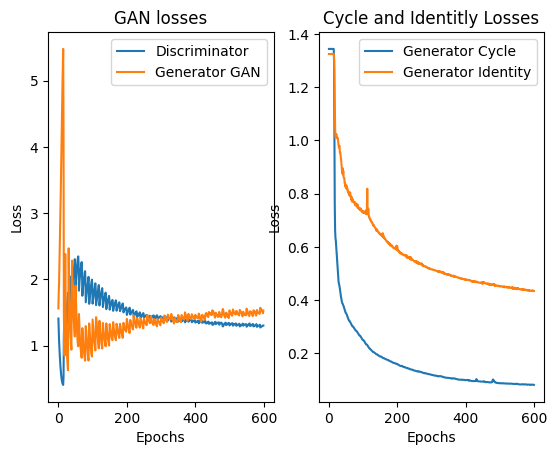

Training complete
train_main_first_model took 82.00858497619629 seconds


In [64]:
model_no_aug = train_main_first_model(hp_no_aug)

In [65]:
fid_aug = test_main_first_model(model_aug, n_images=0, calc_fid=True)
fid_no_aug = test_main_first_model(model_no_aug, n_images=0, calc_fid=True)

<Figure size 1000x1000 with 0 Axes>

FID score G: 118.39375305175781
test_main_first_model took 6.201787710189819 seconds


<Figure size 1000x1000 with 0 Axes>

FID score G: 165.31259155273438
test_main_first_model took 7.0627970695495605 seconds


In [100]:
model_aug.eval()
model_no_aug.eval()

monet_exp1 = random.sample(monet, 10)
photo_exp1 = random.sample(photo, 10)

x = torch.stack(photo_exp1)
y = torch.stack(monet_exp1)

x = pil2inp(x).to(DEVICE)
y = pil2inp(y).to(DEVICE)

x2y_aug, *_ = model_aug(x, y)
x2y_no_aug, *_ = model_no_aug(x, y)

x = inp2pil(x).long().cpu().detach().numpy()
x2y_aug = inp2pil(x2y_aug).long().cpu().detach().numpy()
x2y_no_aug = inp2pil(x2y_no_aug).long().cpu().detach().numpy()

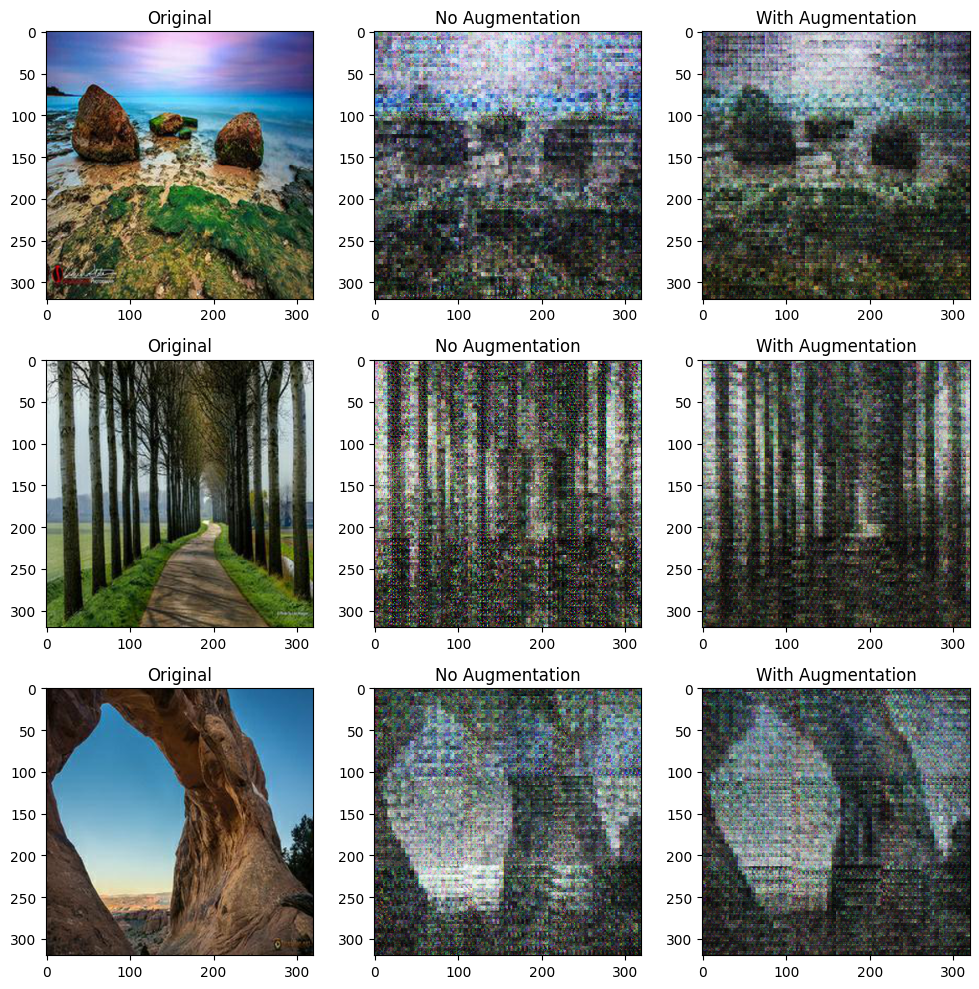

Model with augmentation FID:	118.39375305175781
Model without augmentation FID:	165.31259155273438


In [101]:
plt.figure(figsize=(10, 10))

for i in range(3):
    plt.subplot(3, 3, 3 * i + 1)
    plt.imshow(x[i])
    plt.title("Original")

    plt.subplot(3, 3, 3 * i + 2)
    plt.imshow(x2y_no_aug[i])
    plt.title("No Augmentation")

    plt.subplot(3, 3, 3 * i + 3)
    plt.imshow(x2y_aug[i])
    plt.title("With Augmentation")

plt.tight_layout()
plt.savefig("first_exp_results.png")
plt.show()

print(f"Model with augmentation FID:\t{fid_aug}")
print(f"Model without augmentation FID:\t{fid_no_aug}")


## Exp 2: Lambda Cycle

Define the values to compare.

In [102]:
lam_cycle_vals = [1, 5, 10, 50]

In [103]:
hps = []

for lc in lam_cycle_vals:
    hp_ = copy(HP1)
    hp_["LAM_CYCLE"] = lc

    hps.append(hp_)

Train the models

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model with LAM_CYCLE = 1
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [1/600] Step [0/3] D_X loss: 0.7110 D_Y loss: 0.7154 G_GAN loss: 1.6049 G_Cycle loss: 1.3065 G_Id loss: 1.2894
Epoch [2/600] Step [0/3] D_X loss: 0.5965 D_Y loss: 0.6041 G_GAN loss: 1.6880 G_Cycle loss: 1.3068 G_Id loss: 1.2889
Epoch [3/600] Step [0/3] D_X loss: 0.5193 D_Y loss: 0.5248 G_GAN loss: 2.1307 G_Cycle loss: 1.3069 G_Id loss: 1.2890
Epoch [4/600] Step [0/3] D_X loss: 0.4745 D_Y loss: 0.4857 G_GAN loss: 2.2435 G_Cycle loss: 1.3064 G_Id loss: 1.2892
Epoch [5/600] Step [0/3] D_X loss: 0.4223 D_Y loss: 0.4482 G_GAN loss: 2.3547 G_Cycle loss: 1.3069 G_Id loss: 1.2891
Epoch [6/600] Step [0/3] D_X loss: 0.3850 D_Y loss: 0.4098 G_GAN loss: 2.6692 G_Cycle loss: 1.3069 G_Id loss: 1.2899
Epoch [7/600] Step [0/3] D_X loss: 0.3374 D_Y loss: 0.3672 G_GAN loss: 3.0567 G_Cycle loss: 1.3070 G_Id loss: 1.2885
Epoch [8/600] Step [0/3] 

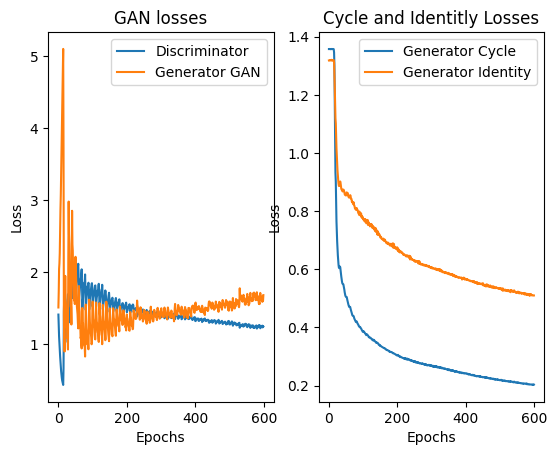

Training complete
train_main_first_model took 83.85376477241516 seconds
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model with LAM_CYCLE = 5
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [1/600] Step [0/3] D_X loss: 0.7104 D_Y loss: 0.7083 G_GAN loss: 1.5513 G_Cycle loss: 1.2876 G_Id loss: 1.2959
Epoch [2/600] Step [0/3] D_X loss: 0.5994 D_Y loss: 0.5869 G_GAN loss: 1.7640 G_Cycle loss: 1.2885 G_Id loss: 1.2970
Epoch [3/600] Step [0/3] D_X loss: 0.5920 D_Y loss: 0.5443 G_GAN loss: 2.0290 G_Cycle loss: 1.2884 G_Id loss: 1.2962
Epoch [4/600] Step [0/3] D_X loss: 0.5366 D_Y loss: 0.5011 G_GAN loss: 1.9631 G_Cycle loss: 1.2868 G_Id loss: 1.2986
Epoch [5/600] Step [0/3] D_X loss: 0.4913 D_Y loss: 0.4492 G_GAN loss: 2.1692 G_Cycle loss: 1.2869 G_Id loss: 1.2967
Epoch [6/600] Step [0/3] D_X loss: 0.4306 D_Y loss: 0.3839 G_GAN loss: 2.6157 G_Cycle loss: 1.2879 G_Id loss: 1.2967
Epoch [7/600] Step [0/3] D_X loss: 0.4477 D_Y loss: 0.3796 G_GAN loss:

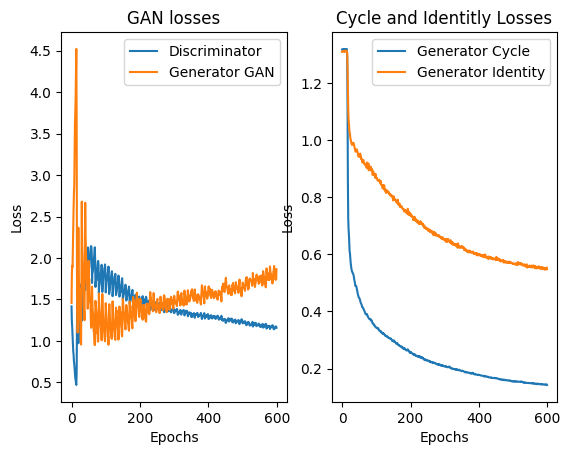

Training complete
train_main_first_model took 83.42337822914124 seconds
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model with LAM_CYCLE = 10
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [1/600] Step [0/3] D_X loss: 0.7420 D_Y loss: 0.7403 G_GAN loss: 1.4509 G_Cycle loss: 1.2945 G_Id loss: 1.3043
Epoch [2/600] Step [0/3] D_X loss: 0.6154 D_Y loss: 0.6122 G_GAN loss: 2.1452 G_Cycle loss: 1.2951 G_Id loss: 1.3048
Epoch [3/600] Step [0/3] D_X loss: 0.5512 D_Y loss: 0.5576 G_GAN loss: 1.8510 G_Cycle loss: 1.2926 G_Id loss: 1.3020
Epoch [4/600] Step [0/3] D_X loss: 0.5165 D_Y loss: 0.5143 G_GAN loss: 1.9137 G_Cycle loss: 1.2971 G_Id loss: 1.3062
Epoch [5/600] Step [0/3] D_X loss: 0.4548 D_Y loss: 0.4651 G_GAN loss: 2.3208 G_Cycle loss: 1.2919 G_Id loss: 1.3007
Epoch [6/600] Step [0/3] D_X loss: 0.4112 D_Y loss: 0.4151 G_GAN loss: 2.7569 G_Cycle loss: 1.2968 G_Id loss: 1.3062
Epoch [7/600] Step [0/3] D_X loss: 0.3769 D_Y loss: 0.3854 G_GAN loss

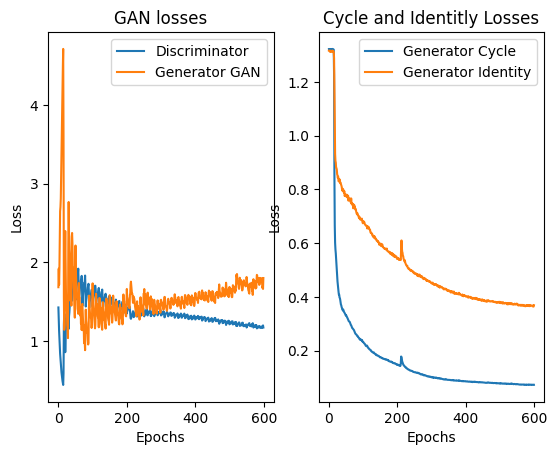

Training complete
train_main_first_model took 83.22878980636597 seconds
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model with LAM_CYCLE = 50
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [1/600] Step [0/3] D_X loss: 0.7086 D_Y loss: 0.7194 G_GAN loss: 1.6418 G_Cycle loss: 1.4615 G_Id loss: 1.3738
Epoch [2/600] Step [0/3] D_X loss: 0.5977 D_Y loss: 0.6165 G_GAN loss: 1.7151 G_Cycle loss: 1.4615 G_Id loss: 1.3750
Epoch [3/600] Step [0/3] D_X loss: 0.5296 D_Y loss: 0.5517 G_GAN loss: 1.9084 G_Cycle loss: 1.4630 G_Id loss: 1.3751
Epoch [4/600] Step [0/3] D_X loss: 0.4747 D_Y loss: 0.5096 G_GAN loss: 2.2038 G_Cycle loss: 1.4619 G_Id loss: 1.3740
Epoch [5/600] Step [0/3] D_X loss: 0.4261 D_Y loss: 0.4629 G_GAN loss: 2.3472 G_Cycle loss: 1.4619 G_Id loss: 1.3745
Epoch [6/600] Step [0/3] D_X loss: 0.3826 D_Y loss: 0.4201 G_GAN loss: 2.5758 G_Cycle loss: 1.4615 G_Id loss: 1.3742
Epoch [7/600] Step [0/3] D_X loss: 0.3649 D_Y loss: 0.4158 G_GAN loss

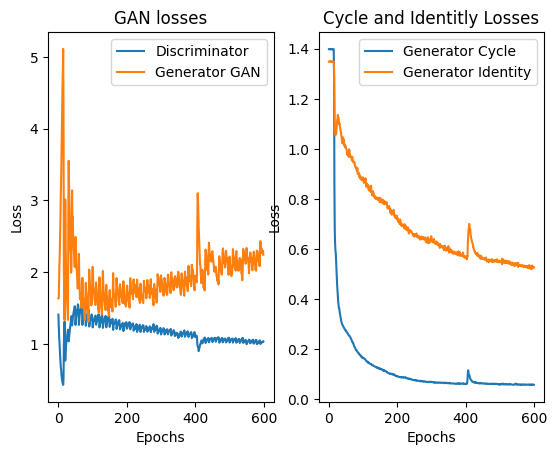

Training complete
train_main_first_model took 83.62822794914246 seconds


In [104]:
lam_cyc_models = []

for lc, hp in zip(lam_cycle_vals, hps):
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    print(f"Training model with LAM_CYCLE = {lc}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    model = train_main_first_model(hp)
    model.eval()
    lam_cyc_models.append(model)

In [105]:
fid = []

for model_ in lam_cyc_models:
    fid_ = test_main_first_model(model_, n_images=0, calc_fid=True)
    fid.append(fid_)

<Figure size 1000x1000 with 0 Axes>

FID score G: 215.90008544921875
test_main_first_model took 6.242419958114624 seconds


<Figure size 1000x1000 with 0 Axes>

FID score G: 127.55888366699219
test_main_first_model took 6.474227666854858 seconds


<Figure size 1000x1000 with 0 Axes>

FID score G: 125.636962890625
test_main_first_model took 5.979257822036743 seconds


<Figure size 1000x1000 with 0 Axes>

FID score G: 182.8216094970703
test_main_first_model took 6.426513195037842 seconds


In [106]:
monet_exp2 = random.sample(monet, 10)
photo_exp2 = random.sample(photo, 10)

x = torch.stack(photo_exp2)
y = torch.stack(monet_exp2)

x = pil2inp(x).to(DEVICE)
y = pil2inp(y).to(DEVICE)

x2y = []

for model in lam_cyc_models:
    x2y_ = model.G(x)
    x2y_ = inp2pil(x2y_).long().cpu().detach().numpy()
    x2y.append(x2y_)

x = inp2pil(x).long().cpu().detach().numpy()

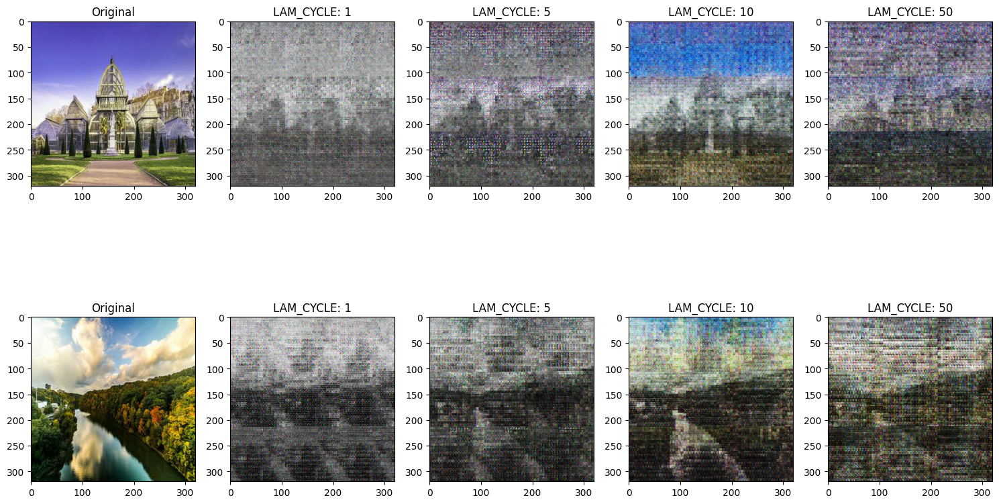

Model with LAM_CYCLE 1 FID:	215.90008544921875
Model with LAM_CYCLE 5 FID:	127.55888366699219
Model with LAM_CYCLE 10 FID:	125.636962890625
Model with LAM_CYCLE 50 FID:	182.8216094970703


In [107]:
plt.figure(figsize=(15, 10))

for i in range(2):
    plt.subplot(2, len(lam_cycle_vals) + 1, i * (len(lam_cycle_vals) + 1) + 1)
    plt.imshow(x[i])
    plt.title("Original")

    for j, lc in enumerate(lam_cycle_vals):
        plt.subplot(2, len(lam_cycle_vals) + 1, i * (len(lam_cycle_vals) + 1) + j + 2)
        plt.imshow(x2y[j][i])
        plt.title(f"LAM_CYCLE: {lc}")

plt.tight_layout()
plt.savefig("exp2_res.jpg")
plt.show()

for i, lc in enumerate(lam_cycle_vals):
    print(f"Model with LAM_CYCLE {lc} FID:\t{fid[i]}")


# Second Model

## Model Class

Define class for the Neural Style Transfer model.
It loads the pretrained VGG19 model, and determines the layers to extract the feature maps from.

In [108]:
print("VGG19 Architecture")
print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
models.vgg19(pretrained=True)

VGG19 Architecture
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 87.9MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [109]:
class NST(nn.Module):
    def __init__(self, layers_from='mid'):
        super(NST, self).__init__()
        if layers_from == 'edge':
            self.style_conv_layers = [1, 2, 3]
            self.content_conv_layers = [14, 15, 16]

        else:
            self.style_conv_layers = [4, 6, 8]
            self.content_conv_layers = [10, 12, 14]

        self.vgg_model = models.vgg19(pretrained=True).features

    def forward(self, x):
        style_feats = []
        content_feats = []

        conv_counter = 0

        for i, layer in enumerate(self.vgg_model):
            x = layer(x)

            if isinstance(layer, nn.Conv2d):
                conv_counter += 1

                if conv_counter in self.style_conv_layers:
                    style_feats.append(x)

                elif conv_counter in self.content_conv_layers:
                    content_feats.append(x)

        return style_feats, content_feats

## Data Process

Randomally select a photo for content and a Monet painting for style, normalize them to the range of 0 to 1, and initialize the generated image as the content one.

In [110]:
def load_data():
    content_image = Image.open(random.sample(photo_paths, 1)[0]).resize(IMG_SIZE)
    style_image = Image.open(random.sample(monet_paths, 1)[0]).resize(IMG_SIZE)

    plt.subplot(1, 2, 1)
    plt.imshow(content_image)
    plt.title("Content Image")

    plt.subplot(1, 2, 2)
    plt.imshow(style_image)
    plt.title("Style Image")

    plt.show()

    content_image = torch.from_numpy(np.array(content_image)).to(DEVICE)
    style_image = torch.from_numpy(np.array(style_image)).to(DEVICE)

    content_image = content_image.resize(1, 3, *IMG_SIZE).float() / 255
    style_image = style_image.resize(1, 3, *IMG_SIZE).float() / 255

    generated_image = content_image.clone().requires_grad_(True)

    return content_image, style_image, generated_image

## Hyper-Parameters and Losses

In [111]:
HP2 = {
    "LR": 0.01,
    "N_EPOCHS": 1000,
    "LAM_STYLE": 1e-6,
}

In [112]:
pkl.dump(HP2, open("second_model_hp.pkl", "wb"))

Define functions that gets two feature maps and calculates the content and the style losses.

In [113]:
mse_loss = nn.MSELoss()

content_loss_func = lambda cf, gf: mse_loss(cf, gf)

def style_loss_func(sf, gf):
    style_loss = []

    a, b, c, d = gf.shape

    g_feats = gf.view(a * b, c * d)
    G = torch.mm(g_feats, g_feats.t())

    s_feats = sf.view(a * b, c * d)
    S = torch.mm(s_feats, s_feats.t())

    style_loss = mse_loss(G, S)

    return style_loss

## Training Functions

Define a function to plot a subplot figure of the content, style and output images.

In [114]:
def plot_triplet(content_image, style_image, generated_image, title=None, path=None):
    content2disp = content_image.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()
    style2disp = style_image.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()
    gen2disp = generated_image.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()

    if title is not None:
        plt.suptitle(title)

    plt.subplot(1, 3, 1)
    plt.imshow(content2disp)
    plt.title("Content Image")

    plt.subplot(1, 3, 2)
    plt.imshow(style2disp)
    plt.title("Style Image")

    plt.subplot(1, 3, 3)
    plt.imshow(gen2disp)
    plt.title("Generated Image")

    plt.tight_layout()

    if path:
        plt.savefig(path)

    plt.show()

In [115]:
def train_nst(model, content_image, style_image, generated_image, lr, num_epochs, lam_style):
    content_losses = []
    style_losses = []

    optimizer = torch.optim.Adam([generated_image], lr=lr)

    for e in tqdm(range(1, 1 + num_epochs), desc="Epochs"):
        _, content_feats = model(content_image)
        style_feats, _ = model(style_image)
        style_gen_feats, content_gen_feats = model(generated_image)

        content_loss = style_loss = 0

        for cf, gcf in zip(content_feats, content_gen_feats):
            content_loss += content_loss_func(cf, gcf)

        for sf, gsf in zip(style_feats, style_gen_feats):
            style_loss += style_loss_func(sf, gsf)

        loss = content_loss + lam_style * style_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        content_losses.append(content_loss)
        style_losses.append(style_loss)

        if e % 200 == 0:
            plot_triplet(
                content_image,
                style_image,
                generated_image,
                title=f"Epoch {e} - Content Loss: {np.round(content_loss.item(), 2)} Style Loss: {np.round(style_loss.item(), 4)}"
            )

    # plot losses in loglog scale

    content_losses = [cl.cpu().detach() for cl in content_losses]
    style_losses = [cl.cpu().detach() for cl in style_losses]

    plt.subplot(1, 2, 1)
    plt.title("Content Loss")
    plt.plot(range(1, 1 + len(content_losses)), content_losses, label='Content Loss')
    plt.ylabel("Loss")
    plt.xlabel("Epoch")

    plt.subplot(1, 2, 2)
    plt.title("Style Loss")
    plt.plot(range(1, 1 + len(style_losses)), style_losses, label='Style Loss')
    plt.xlabel("Epoch")
    plt.loglog()

    plt.tight_layout()
    plt.savefig("second_model_losses.png")
    plt.show()


    return model

Main function for the second model training.

Gets a dictionary of hyper-parameters, and outputs the trained model.

In [121]:
@timer
def train_main_second_model(hp):
    content_image, style_image, generated_image = load_data()

    # create a model
    model = NST().to(DEVICE).eval()

    # train the model
    train_nst(
        model = model,
        content_image=content_image,
        style_image=style_image,
        generated_image=generated_image,
        lr=hp["LR"],
        num_epochs=hp["N_EPOCHS"],
        lam_style=hp["LAM_STYLE"]
    )

    print("Training complete")
    plot_triplet(content_image, style_image, generated_image, title="Final Results", path="second_final_results.png")

## Training Process

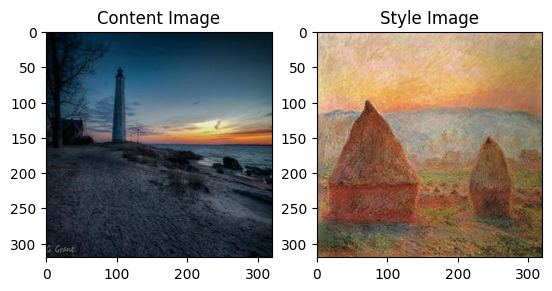

Epochs:  20%|█▉        | 198/1000 [00:03<00:13, 57.54it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


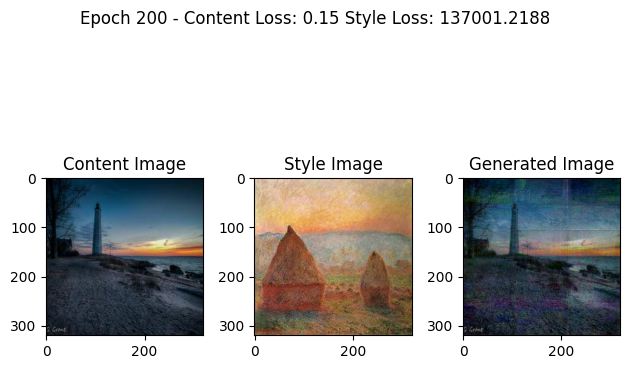

Epochs:  40%|███▉      | 396/1000 [00:07<00:10, 57.49it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


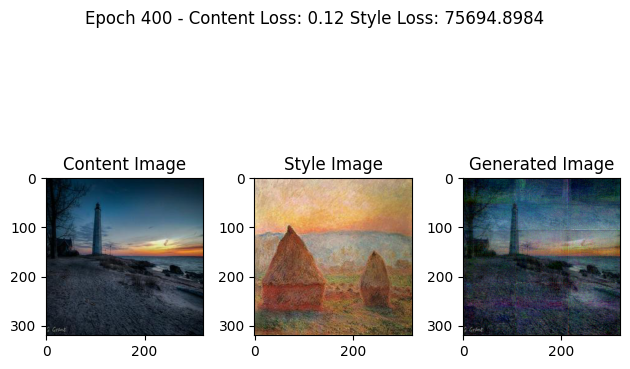

Epochs:  60%|█████▉    | 595/1000 [00:11<00:07, 57.47it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


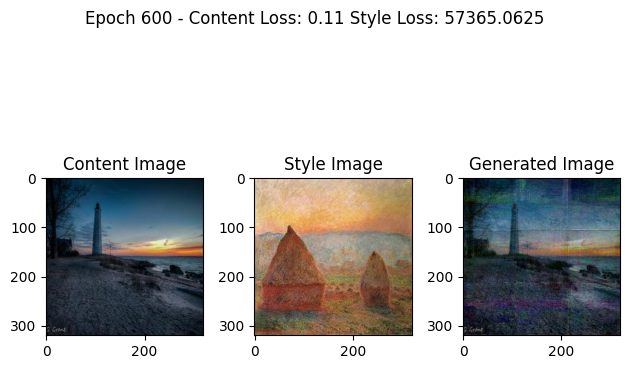

Epochs:  79%|███████▉  | 794/1000 [00:15<00:03, 57.55it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


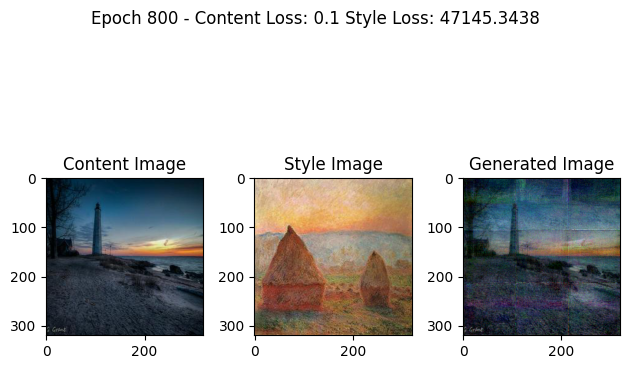

Epochs: 100%|█████████▉| 999/1000 [00:19<00:00, 57.56it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


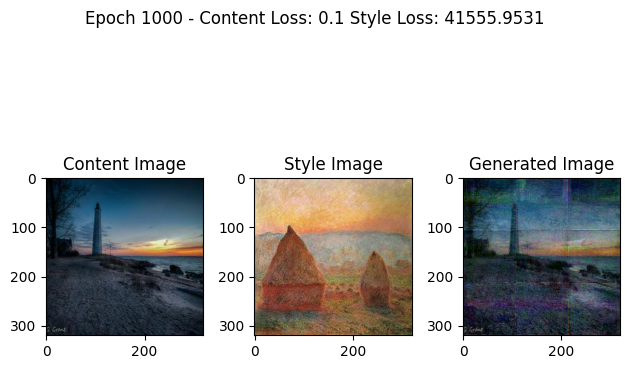

Epochs: 100%|██████████| 1000/1000 [00:19<00:00, 50.39it/s]


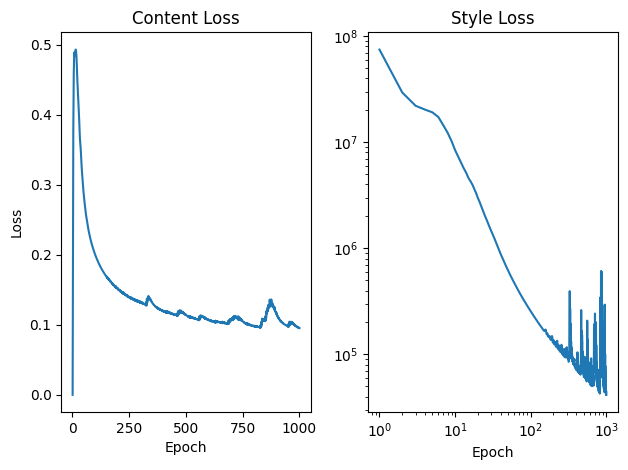

Training complete


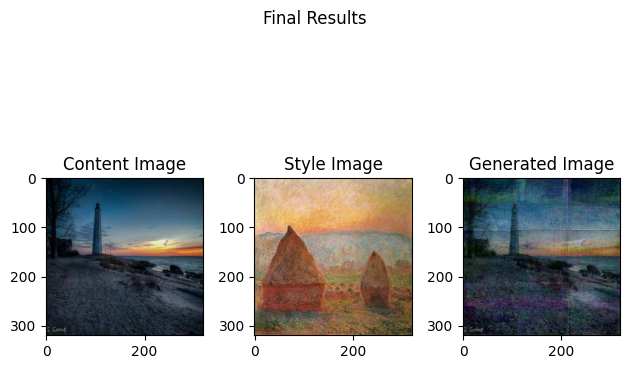

train_main_second_model took 23.77413558959961 seconds


In [123]:
second_model = train_main_second_model(HP2)

# Second Model Experiments

## Exp 3: Edge vs Mid Convolutional Layers

The Neural Style Transfer framework uses the earlier and latter feature maps extracted from the VGG19 model, as an indication for "style" and "content", respectively. This experiment is about checking whether the definitions of "earlier" and "latter" layers should be treated as "the very first" and "the very last" layers, or a softer meaning of "start-mid" or "mid-end" layers is more appropriate.

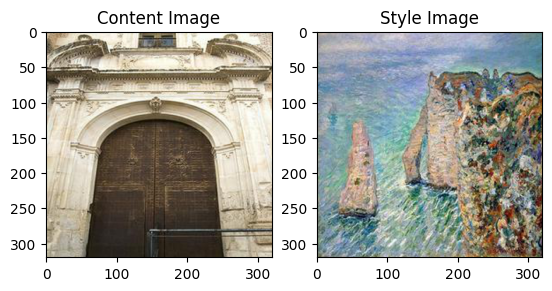

In [133]:
content_image, style_image, _ = load_data()

generated_image_edge = content_image.clone().requires_grad_(True)
generated_image_mid = content_image.clone().requires_grad_(True)

edge_model = NST(layers_from="edge").to(DEVICE).eval()
mid_model = NST(layers_from="mid").to(DEVICE).eval()

Train edge model.

Epochs:  20%|█▉        | 198/1000 [00:03<00:13, 59.14it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


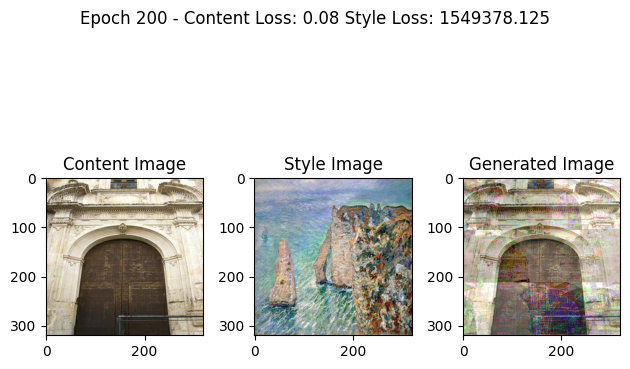

Epochs:  40%|███▉      | 397/1000 [00:07<00:10, 59.19it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


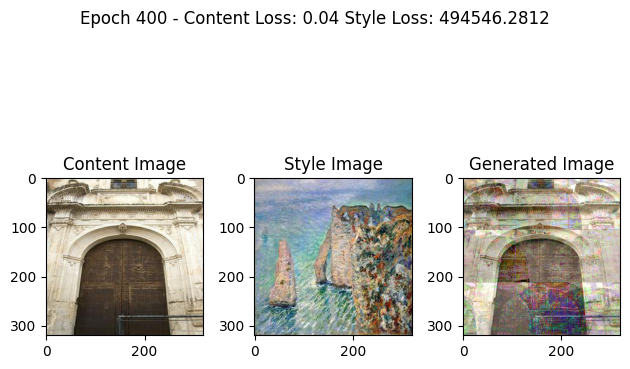

Epochs:  60%|█████▉    | 596/1000 [00:11<00:06, 59.15it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


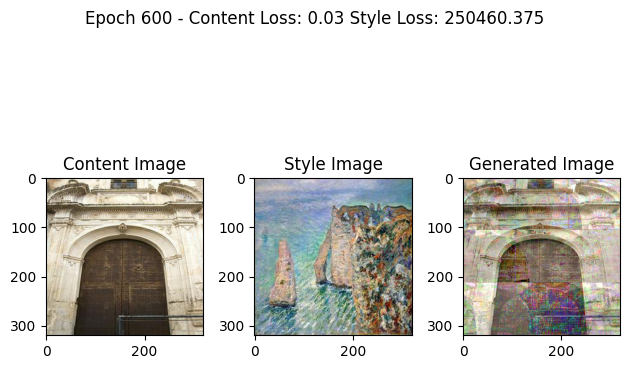

Epochs:  80%|███████▉  | 795/1000 [00:14<00:03, 59.16it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


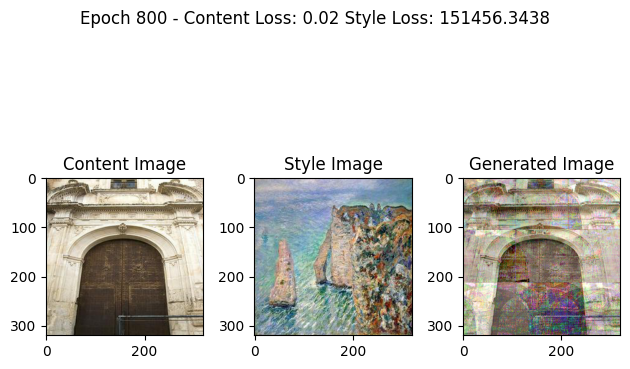

Epochs:  99%|█████████▉| 994/1000 [00:18<00:00, 59.17it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


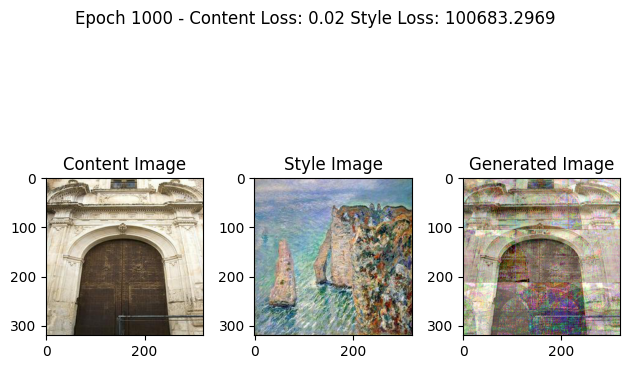

Epochs: 100%|██████████| 1000/1000 [00:19<00:00, 51.65it/s]


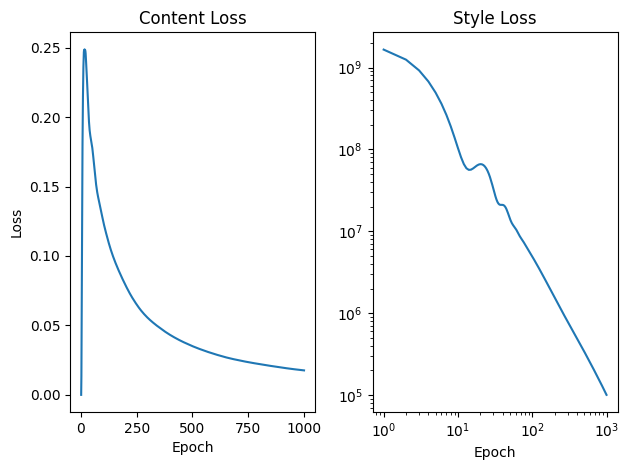

NST(
  (vgg_model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), pad

In [135]:
train_nst(
        model = edge_model,
        content_image=content_image,
        style_image=style_image,
        generated_image=generated_image_edge,
        lr=HP2["LR"],
        num_epochs=HP2["N_EPOCHS"],
        lam_style=HP2["LAM_STYLE"]
    )

Train mid model.

Epochs:  20%|█▉        | 198/1000 [00:03<00:13, 57.49it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


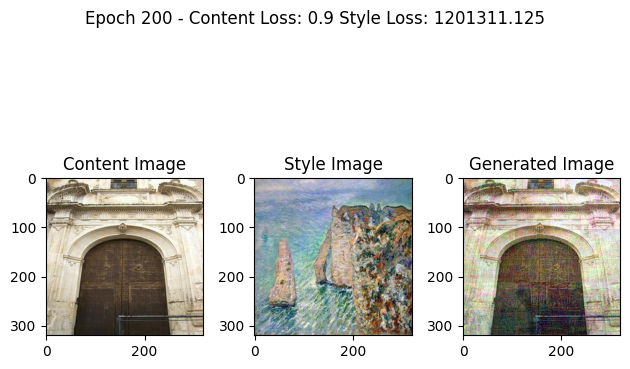

Epochs:  40%|███▉      | 396/1000 [00:07<00:10, 57.53it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


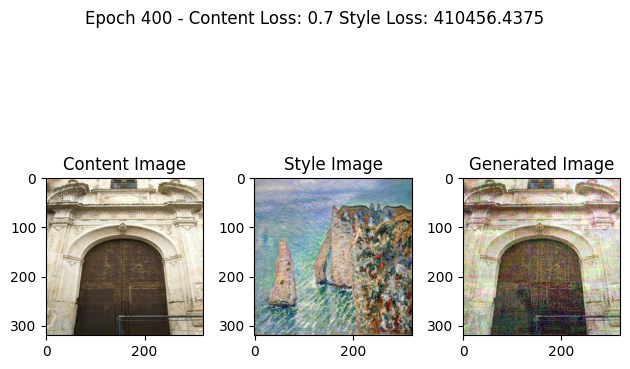

Epochs:  60%|█████▉    | 595/1000 [00:11<00:07, 57.53it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


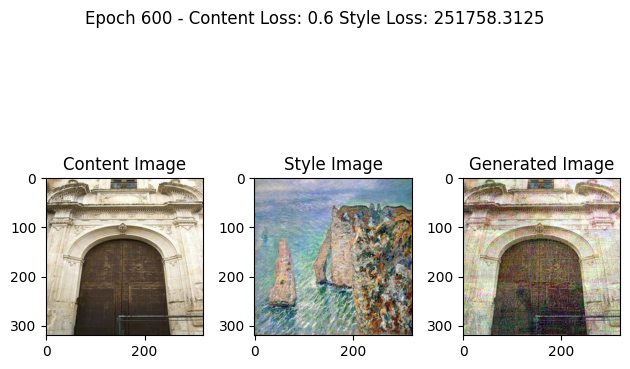

Epochs:  79%|███████▉  | 794/1000 [00:15<00:03, 57.54it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


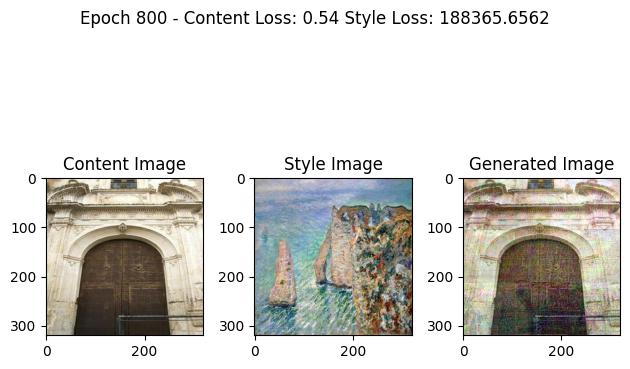

Epochs: 100%|█████████▉| 999/1000 [00:19<00:00, 57.50it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


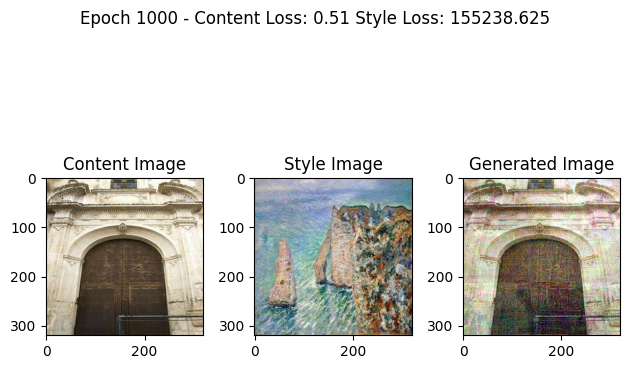

Epochs: 100%|██████████| 1000/1000 [00:19<00:00, 50.36it/s]


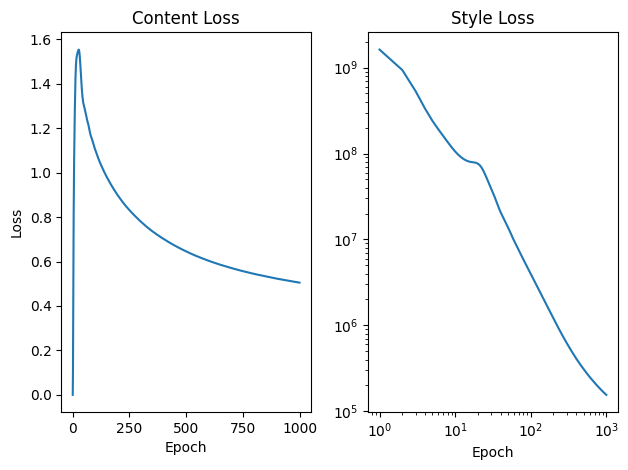

NST(
  (vgg_model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), pad

In [136]:
train_nst(
        model = mid_model,
        content_image=content_image,
        style_image=style_image,
        generated_image=generated_image_mid,
        lr=HP2["LR"],
        num_epochs=HP2["N_EPOCHS"],
        lam_style=HP2["LAM_STYLE"]
    )

In [137]:
content2disp = content_image.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()
style2disp = style_image.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()
mid_gen2disp = generated_image_mid.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()
edge_gen2disp = generated_image_edge.resize(*IMG_SIZE, 3).squeeze(0).cpu().detach().numpy()

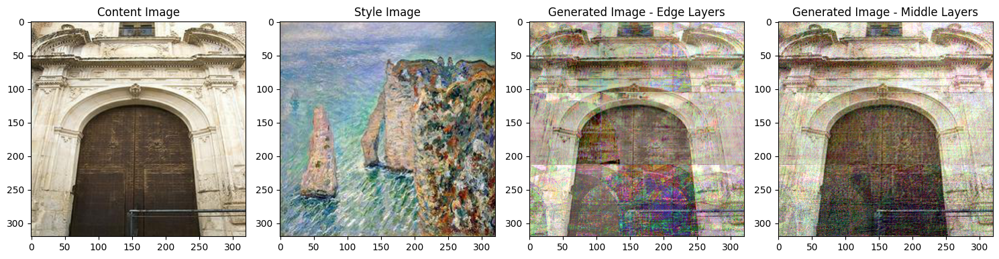

In [138]:
plt.figure(figsize= (15, 15))

plt.subplot(1, 4, 1)
plt.imshow(content2disp)
plt.title("Content Image")

plt.subplot(1, 4, 2)
plt.imshow(style2disp)
plt.title("Style Image")

plt.subplot(1, 4, 3)
plt.imshow(edge_gen2disp)
plt.title("Generated Image - Edge Layers")

plt.subplot(1, 4, 4)
plt.imshow(mid_gen2disp)
plt.title("Generated Image - Middle Layers")

plt.tight_layout()

plt.savefig("exp3_results.png")

plt.show()